In [6]:
import numpy as np
import torch
from neurodiffeq.neurodiffeq import safe_diff as diff
from neurodiffeq.ode import solve, solve_system
from neurodiffeq.conditions import IVP
from neurodiffeq.networks import FCNN # fully-connect neural network
import torch.nn as nn                 # PyTorch neural network module
from neurodiffeq.conditions import DirichletBVP2D #boundary conditions(we can also customize based on our needs)
from neurodiffeq.solvers import Solver2D
from neurodiffeq.monitors import Monitor2D
from neurodiffeq.generators import Generator2D
from neurodiffeq.conditions import IBVP1D 
from neurodiffeq.pde import make_animation
import copy
from mpl_toolkits.mplot3d  import Axes3D

# check if GPU is available and use it; otherwise use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

import matplotlib.pyplot as plt
%matplotlib notebook
#plt.rcParams['animation.embed_limit'] = 2**128 # MB

# Intro to F-principle

An important fact determining the convergence behavior of the DL networks and PINN linear solvers is the Frequency-principle (F-principle): DNNs often fit target functions from low to high frequencies during the training process. The F-principle implies that in PINNs, the low frequency / large scale features of the solution emerge first, while it will take several training epochs to recover high frequency / small-scale features.

We choose such a source term as it has a simple solution and to show the F-principle’s impact on the convergence of PINN to the numerical solution: we expect the lower frequency components, e.g., 𝑘 = 1, to convergence faster than the higher frequency components present in the solution (𝑘 = 2, 3, 4).

# Verification by an example

Recall that we solve a non-homogeneous 2-D Poisson equation with an increasing frequency source term with homogeneous Dirichlet boundary condition:

$$
F(u, x, y) = \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} = \frac{1}{4}\sum_{k = 1}^{4}(-1)^{k+1} \ 2k  \ sin(k\pi x)sin(k\pi y)
$$

Then we approximate the four components correspondingly, from the low frequency to higher frequency. (k=1, 2, 3, 4)


for $(x, y) \in [0, 1] \times [0, 1]$

s.t.

$$
u(x, y)\bigg|_{x=0} = 0 \\
u(x, y)\bigg|_{x=1} = 0 \\
u(x, y)\bigg|_{y=0} = 0 \\
u(x, y)\bigg|_{y=1} = 0
$$

The analytical solution is

$$
u(x, y) = \sum_{k = 1}^4(-1)^k \ \frac{sin(k\pi x)sin(k\pi y)}{4k \pi^2}
$$

Here we have a Dirichlet boundary condition on both 4 edges of the orthogonal box. We will be using `DirichletBVP2D` for this boundary condition. The arguments `x_min_val`, `x_max_val`, `y_min_val` and `y_max_val` correspond to $u(x, y)\bigg|_{x=0}$, $u(x, y)\bigg|_{x=1}$, $u(x, y)\bigg|_{y=0}$ and $u(x, y)\bigg|_{y=1}$. Note that they should all be functions of $x$ or $y$. These functions are expected to take in a `torch.tensor` and return a `torch.tensor`.

In [7]:
# Define the PDE system
# There's only one Poisson equation in the system, so the function maps (u, x, y) to a single entry

poisson1 = lambda u, x, y: [diff(u, x, order=2) + diff(u, y, order=2) - 0.5 * (-1)**(k+1) * k * torch.sin(k*np.pi*x) * torch.sin(k*np.pi*y)]

# Define the boundary conditions
# There's only one function to be solved for, so we only have a single condition
conditions = [
    DirichletBVP2D(
        x_min=0, x_min_val=lambda y: 0, 
        x_max=1, x_max_val=lambda y: 0, 
        y_min=0, y_min_val=lambda x: 0, 
        y_max=1, y_max_val=lambda x: 0,
    )
]

# Define the monitor callback
monitor=Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1))
monitor_callback = monitor.to_callback()

train_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')
valid_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

net_origin = [FCNN(n_input_units=2,n_output_units=1,
              hidden_units=(64, 64, 64, 64), actv=nn.Tanh,)]

#Create four independent neural networks with the same configuration
nets_f1 = copy.deepcopy(net_origin)
nets_f2 = copy.deepcopy(net_origin)
nets_f3 = copy.deepcopy(net_origin)
nets_f4 = copy.deepcopy(net_origin)

In [8]:
from itertools import chain
from torch.optim import LBFGS

LBFGS_Poisson = LBFGS(
    chain.from_iterable(n.parameters() for n in nets_f1), 
    lr=0.01,                                          
)

LBFGS_Poisson2 = LBFGS(
    chain.from_iterable(n.parameters() for n in nets_f2), 
    lr=0.01,                                          
)

LBFGS_Poisson3 = LBFGS(
    chain.from_iterable(n.parameters() for n in nets_f3), 
    lr=0.01,                                          
)

LBFGS_Poisson4 = LBFGS(
    chain.from_iterable(n.parameters() for n in nets_f4), 
    lr=0.01,                                          
)

## k = 1

In [10]:
# begin with the lowest frequency component k=1
k = 1

solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS_Poisson,
)

solver1.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson1 = solver1.get_solution()

Training Progress:   0%|                                                                       | 0/500 [00:00<…

KeyboardInterrupt: 

## k = 2

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


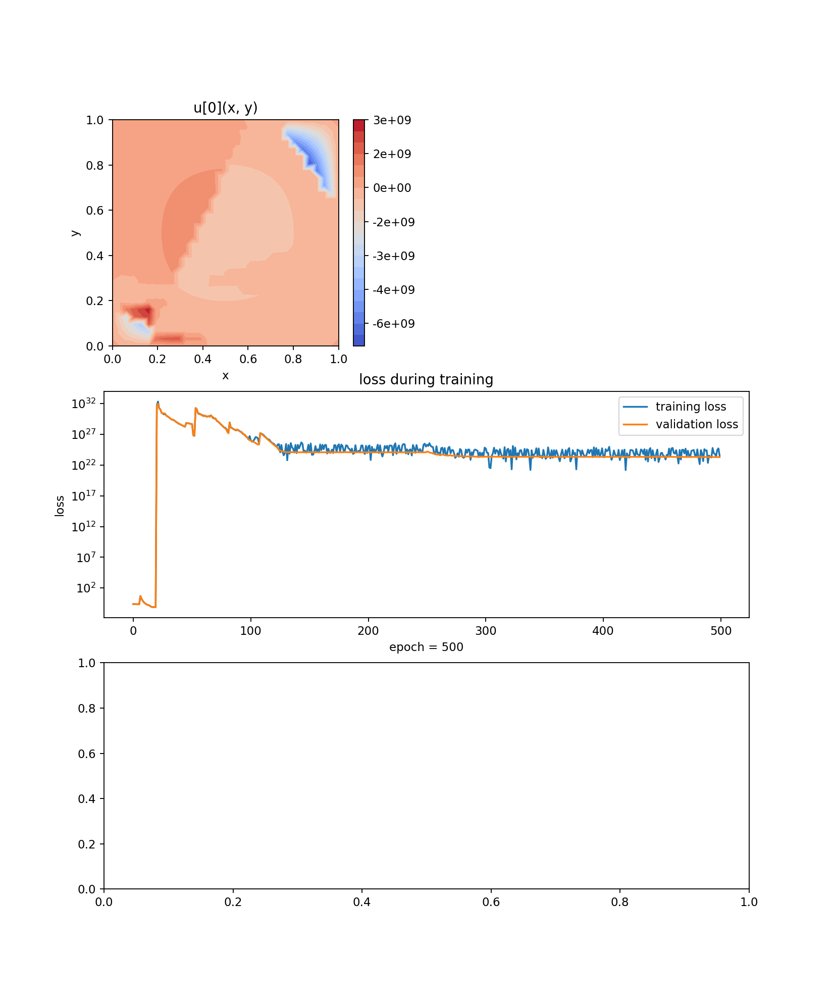

In [5]:
k = 2

solver2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f2,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS_Poisson2,
)

solver2.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson2 = solver2.get_solution()

## k = 3

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


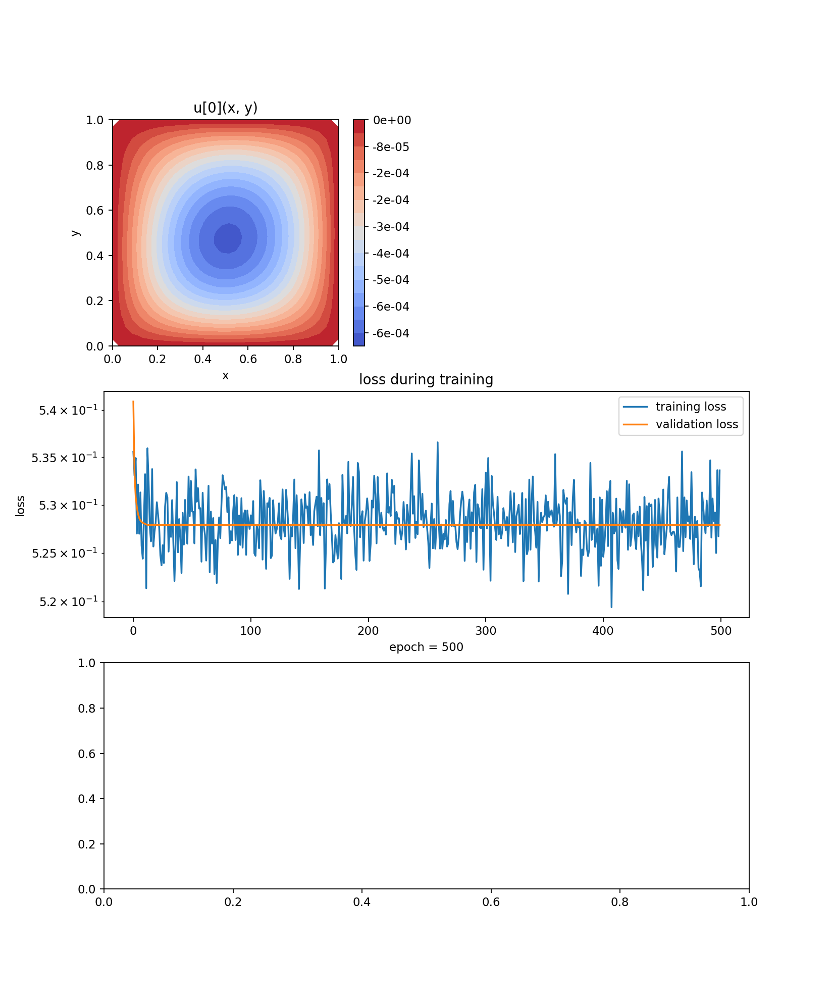

In [6]:
k = 3

solver3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f3,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS_Poisson3,
)

solver3.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson3 = solver3.get_solution()

## k = 4

Training Progress:   0%|                                                                       | 0/500 [00:00<…

<IPython.core.display.Javascript object>


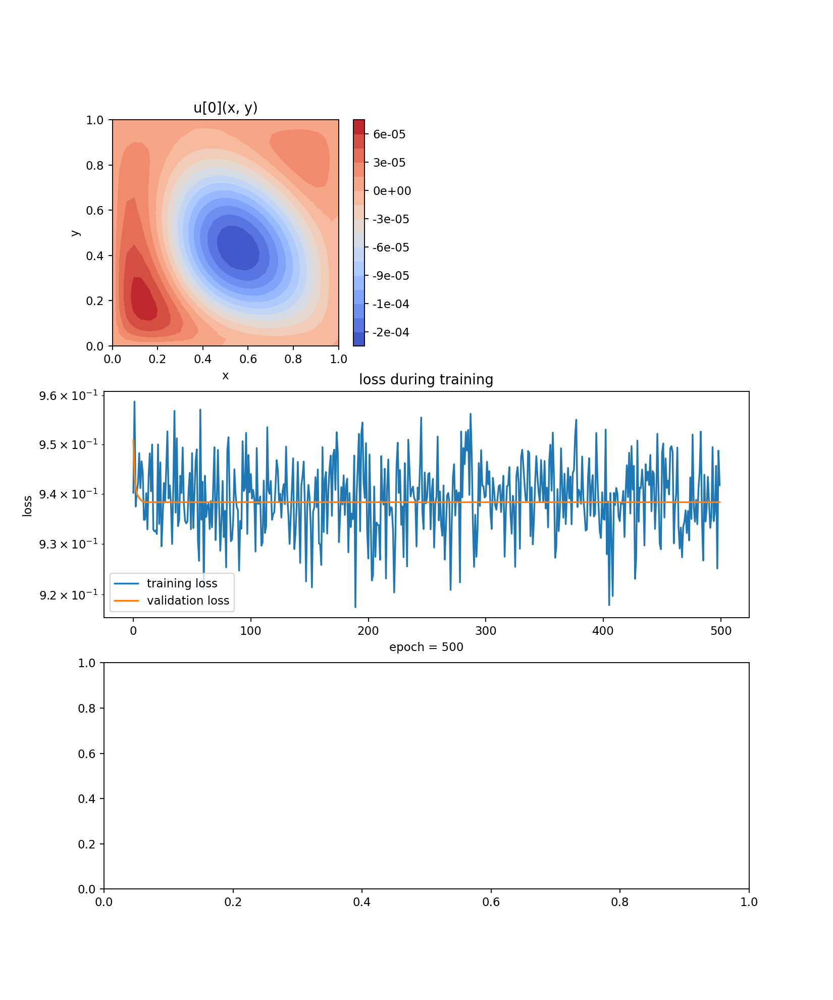

In [7]:
k = 4

solver4 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f4,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS_Poisson4,
)

solver4.fit(max_epochs=500, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson4 = solver4.get_solution()

In [8]:
#As we restored the loss history in corresponding metrics, we recall them to plot comparison figures.
loss1_lbfgs = solver1.metrics_history
print(loss1_lbfgs)

{'train_loss': [0.05456118574146557, 0.026553167871532998, 0.015111558734768122, 0.010393807715679848, 0.00830338763799928, 0.007214420322748967, 0.006533366686314721, 0.006151558359554084, 0.00586718092874719, 0.005649073432976864, 0.00544120014252423, 0.005283001460203555, 0.005055831237202112, 0.004642375981717436, 0.002582277133595796, 0.0014894043811089861, 0.0008973616750827863, 0.0006009054017215397, 0.00043294218304004315, 0.0003280637398607746, 0.00026042570297036015, 0.00021375139643671327, 0.00017507283824050925, 0.00014528851589328077, 0.00011756190060080518, 9.493722213257084e-05, 7.640868119797364e-05, 5.989183201393098e-05, 4.9642857825854455e-05, 4.058798071543414e-05, 3.193453481630757e-05, 2.43735313319976e-05, 1.75217841190487e-05, 1.295017140720872e-05, 1.012774641769045e-05, 8.047715006912785e-06, 6.238848829504878e-06, 5.351540169438724e-06, 4.8079423020289445e-06, 4.286686897725939e-06, 3.688131777604683e-06, 2.8708750040986686e-06, 2.1411234909559745e-06, 1.5612

In [9]:
loss2_lbfgs = solver2.metrics_history
print(loss2_lbfgs)

{'train_loss': [0.2454807275427633, 0.23854321324047492, 0.23415671718913814, 0.23248677213249758, 0.23059327488396675, 0.22689874831351625, 4.945315822616569, 1.7111461410476225, 0.8375647722348945, 0.47594069803909217, 0.3119307923889883, 0.23189957344548917, 0.18905521160340794, 0.16212306405701052, 0.13376250768423342, 0.09223684310745123, 0.08272838809758998, 0.07855288456976159, 0.07667104916102813, 0.07476219356620421, 5.417936807131663e+31, 2.1061070567247917e+32, 1.717068794262706e+31, 1.135317376764783e+31, 3.212693032271637e+30, 2.3574804199331868e+30, 1.725253143850335e+30, 2.2093085569437384e+30, 1.1043458709750917e+30, 8.401126964626595e+29, 6.124348804912416e+29, 4.5013934778360164e+29, 3.0205912121860053e+29, 2.3199285594001202e+29, 2.2757487741208257e+29, 1.6521425680916e+29, 1.2022553755456775e+29, 8.934071686434417e+28, 6.30123201095211e+28, 4.8640044782344415e+28, 4.094508406809446e+28, 3.1104589814926915e+28, 2.6033686494746806e+28, 1.9794871965451096e+28, 1.701293

In [10]:
loss3_lbfgs = solver3.metrics_history
print(loss3_lbfgs)

{'train_loss': [0.5355833872816054, 0.5330649449386329, 0.5349262495487166, 0.5270150205575906, 0.5321433695742075, 0.5269977892763344, 0.5313080812021174, 0.5257634049210247, 0.5244137184627751, 0.5286102533437127, 0.5332270567377186, 0.521367079277359, 0.5359546410184463, 0.5324756675066029, 0.5277446875218748, 0.5262097175116477, 0.5337628259930681, 0.5256742608585852, 0.5271551647672483, 0.5281824057919087, 0.5302840977411659, 0.5290051170888423, 0.5276551429473889, 0.5247564403743687, 0.5237218378087669, 0.5258083619195718, 0.523968364956048, 0.5298231407506389, 0.5312674911680584, 0.5307947425612419, 0.5251460693668887, 0.5279405909294164, 0.526669856055872, 0.5305055549985389, 0.5262962907902984, 0.5221107941770047, 0.5261506314557749, 0.5323901527546949, 0.5250693596386296, 0.528522997143492, 0.5266138295952638, 0.5229233147625774, 0.5291748068692027, 0.5258741480065839, 0.5305292850057393, 0.5274225663335798, 0.5259671893181854, 0.5329788091661034, 0.528821505462715, 0.5325140

In [11]:
loss4_lbfgs = solver4.metrics_history
print(loss4_lbfgs)

{'train_loss': [0.9402327860705129, 0.9587145705924204, 0.9374725096950653, 0.9405285467830649, 0.9422196609738227, 0.9482215002464361, 0.9411567702880169, 0.9465736652721514, 0.9444016289668391, 0.9348183805265948, 0.9348838971304636, 0.9401644215483361, 0.9329129385518528, 0.9435974485350217, 0.9481856333622717, 0.9405184931733591, 0.9499766892165854, 0.9329008312381875, 0.9325182803133589, 0.9327106712786863, 0.9319861181951559, 0.9499889022710436, 0.9340102629484472, 0.9463389423693047, 0.9295538411442648, 0.9355982147748697, 0.9421910374111477, 0.9382726343709631, 0.9451487512502906, 0.9526156242337431, 0.9390871399242022, 0.9417123542060442, 0.9381148244838203, 0.9300053413542119, 0.9411475663599063, 0.9567999313313815, 0.9362458631256136, 0.9512247612673932, 0.933561245530707, 0.9347484812452851, 0.9436448919861753, 0.9401862398957465, 0.9493622318660522, 0.9382010496413755, 0.9346130739078125, 0.934110112747929, 0.9344872676746018, 0.9404526955286199, 0.9442354802807033, 0.9329

<IPython.core.display.Javascript object>


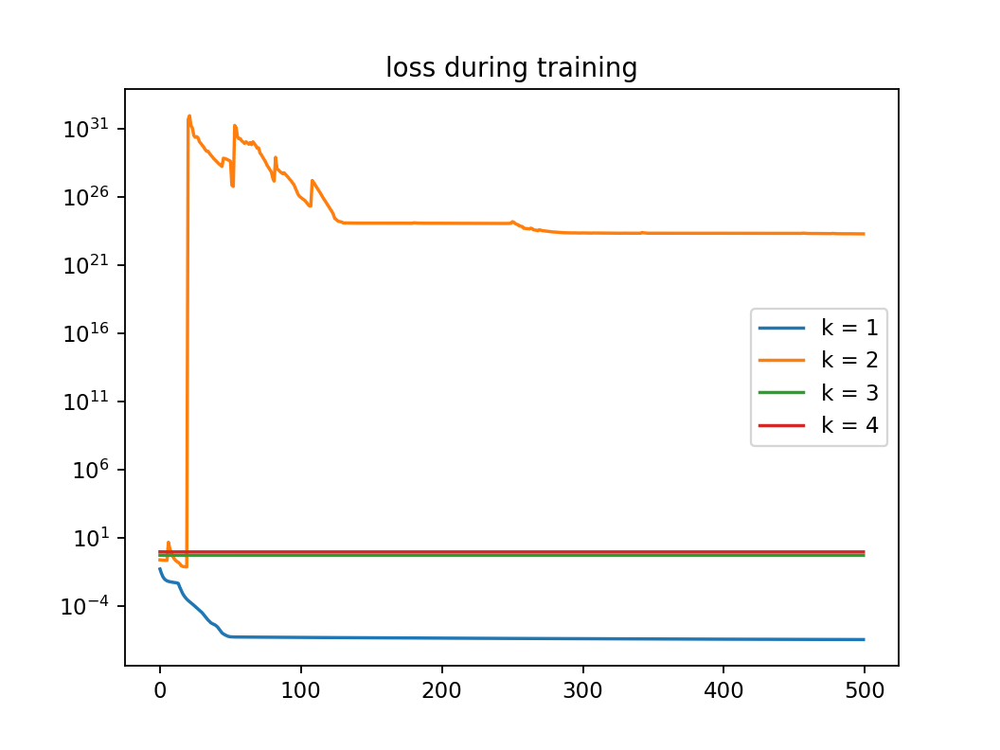

In [12]:
plt.figure()
plt.plot(loss1_lbfgs['valid_loss'], label='k = 1')
plt.plot(loss2_lbfgs['valid_loss'], label='k = 2')
plt.plot(loss3_lbfgs['valid_loss'], label='k = 3')
plt.plot(loss4_lbfgs['valid_loss'], label='k = 4')
plt.yscale('log')
plt.title('loss during training')
plt.legend()
plt.show()

## Cons and a Backup Optimizer

The simulation result shows that, the trial approximator goes to another function quickly. Hence, we conclude that L-BFGS-B optimizer should not used at the beginning of the training as it can converge quickly to a wrong solution (a local minimum in the optimization problem).

We reconstruct our training process using Adam optimizer for 5000 epochs.Remember to reinitialize the PiNNs. Otherwise, the descent direction will be misguided by previous neural networks trained by L-BFGS-B optimizer and go to wrong functions.

Training Progress:   0%|                                                                      | 0/3000 [00:00<…

<IPython.core.display.Javascript object>


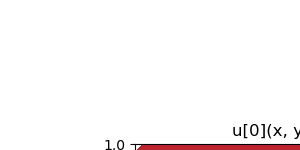

In [ ]:
#Reinitialize the neural networks
nets_f1 = copy.deepcopy(net_origin)

k = 1

solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f1,
    train_generator=train_gen,
    valid_generator=valid_gen,

)

solver1.fit(max_epochs=3000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson1 = solver1.get_solution()

In [ ]:
nets_f2 = copy.deepcopy(net_origin)

k = 2

solver2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f2,
    train_generator=train_gen,
    valid_generator=valid_gen,

)

solver2.fit(max_epochs=3000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson2 = solver2.get_solution()

Training Progress:   0%|                                                                      | 0/3000 [00:00<…

<IPython.core.display.Javascript object>


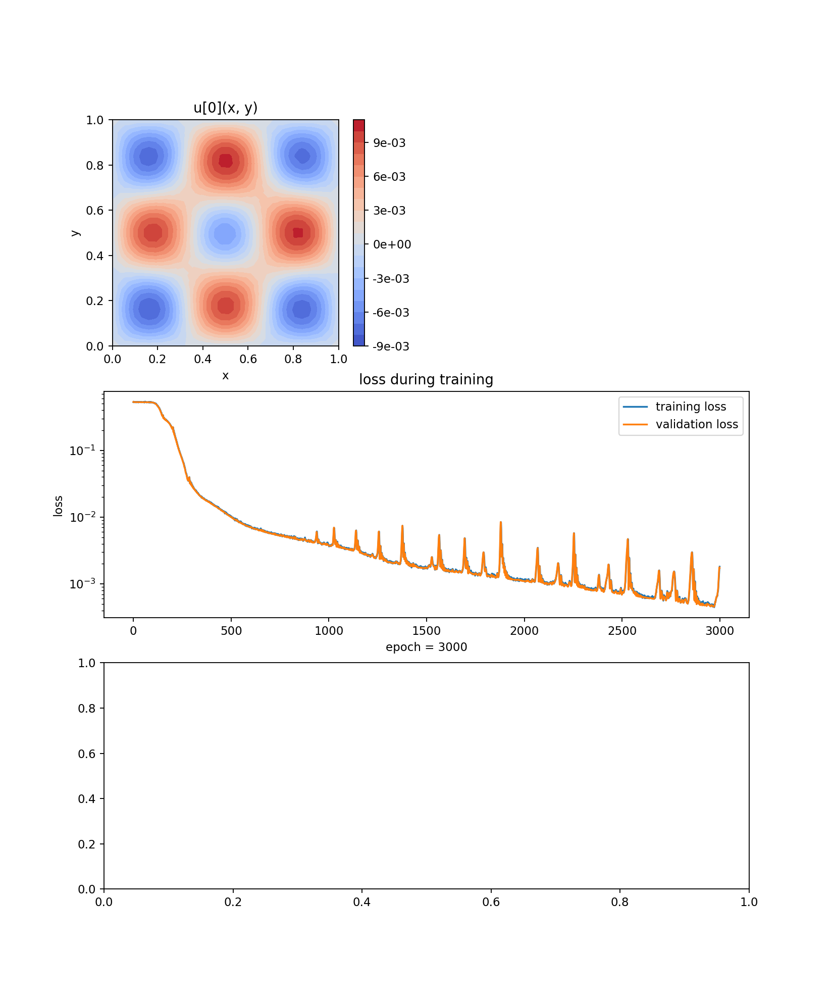

In [82]:
nets_f3 = copy.deepcopy(net_origin)

k = 3

solver3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f3,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver3.fit(max_epochs=3000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson3 = solver3.get_solution()

Training Progress:   0%|                                                                      | 0/3000 [00:00<…

<IPython.core.display.Javascript object>


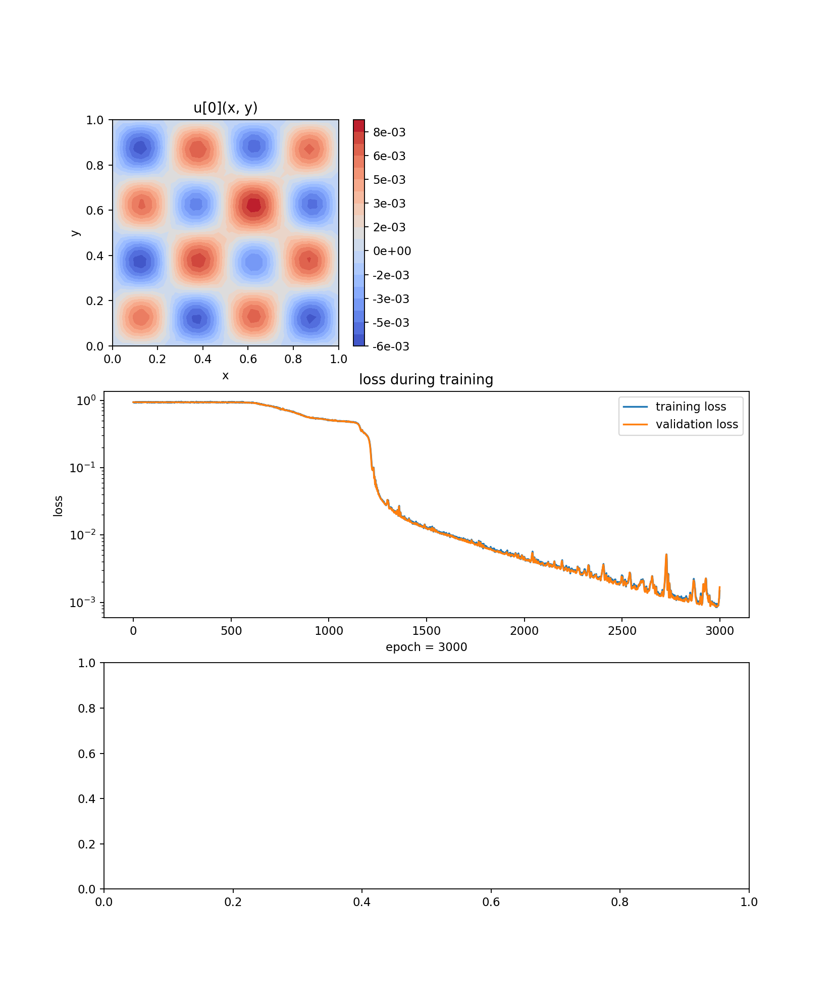

In [76]:
nets_f4 = copy.deepcopy(net_origin)

k = 4

solver4 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f4,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver4.fit(max_epochs=3000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson4 = solver4.get_solution()

In [83]:
loss1_adam = solver1.metrics_history
print(loss1_adam)

{'train_loss': [0.061754369386179384, 0.0326717325128267, 0.015181033322555042, 0.007552443507310937, 0.008144967364268164, 0.012675701521854486, 0.015788060669543122, 0.015583661725028092, 0.013169959870718208, 0.010195559531016848, 0.007955598375794402, 0.006844485277043163, 0.006832594346193061, 0.007532079713958259, 0.008540969379095558, 0.009177610096051118, 0.009431127497918612, 0.009244078060009521, 0.008705288966135356, 0.008020718537817315, 0.00738165057809983, 0.006863626132728047, 0.006562041355716488, 0.0065155973924999645, 0.006681572668819587, 0.006847749651025869, 0.007030200173270416, 0.007186894483175807, 0.007146284391722735, 0.007035865453311478, 0.006813428557742715, 0.0065981038276005256, 0.0064701055971006765, 0.006327276064055535, 0.00631869634660202, 0.006302070337110502, 0.006342428606412385, 0.00642563628480595, 0.0064166296745325185, 0.0064223160863866105, 0.0063321936087263634, 0.006208193552572281, 0.0061490745332698485, 0.0060554166266741745, 0.00599354317

In [84]:
loss2_adam = solver2.metrics_history
print(loss2_adam)

{'train_loss': [0.2350170784899881, 0.2339274887751394, 0.23192720296828756, 0.23008196873530984, 0.23205271334094815, 0.23061959739320695, 0.22934245693609154, 0.22919977085948257, 0.22713158116724713, 0.22517931845697042, 0.22491158053940527, 0.22220525473105607, 0.21920770548964497, 0.21732033988399388, 0.21664573897678474, 0.21441466474734255, 0.20919835498879952, 0.20657388008486108, 0.20244929200842932, 0.19701556875577475, 0.19464515808185706, 0.1887933832698791, 0.1832813264234852, 0.17684806527506464, 0.16942080728018488, 0.1636073227154139, 0.15310558306832417, 0.14393494881000035, 0.13470593337272, 0.12539089440683437, 0.11494081378492896, 0.1056478877476329, 0.09533452035721532, 0.08632388001139732, 0.07781981066617841, 0.07109061303790215, 0.068860844804385, 0.09163086380623739, 0.06570693230540475, 0.08529465159326369, 0.06411378506293014, 0.08537748743737825, 0.06562585587952072, 0.07985045504601897, 0.07111645703661215, 0.06964251199353162, 0.07588091381351153, 0.064414

In [85]:
loss3_adam = solver3.metrics_history
print(loss3_adam)

{'train_loss': [0.5276981791637518, 0.5363657736677092, 0.5301599652355339, 0.5280797240198921, 0.5328362579612937, 0.5295012905723313, 0.5261938226536114, 0.5268167231981962, 0.5289276390559636, 0.5234498580494282, 0.5315657072708848, 0.5302611002738759, 0.5252980532075803, 0.5271186868989586, 0.5313191924057331, 0.5312461275895447, 0.5329562410757658, 0.5225041732051544, 0.5269337057957739, 0.5292298350999283, 0.533838769124181, 0.5311197659638143, 0.5277376381764611, 0.5282989558040838, 0.5277233815982425, 0.5218876840939779, 0.5279136103815951, 0.5256873927830042, 0.5294206565242616, 0.533174478381098, 0.5245128673415773, 0.527937475558844, 0.5282142792133155, 0.5270629562358649, 0.5286633227598458, 0.5291036389350583, 0.5290935369908435, 0.5258147671333275, 0.5321212575786185, 0.5309438532139928, 0.5235668436121802, 0.529486298115073, 0.528558513315152, 0.5307310383753557, 0.5262231284964141, 0.5268698445537083, 0.5265795375676049, 0.5250276731801389, 0.5259664075609614, 0.5268443

In [77]:
loss4_adam = solver4.metrics_history
print(loss4_adam)

{'train_loss': [0.9373941682465441, 0.9362058417392466, 0.9388912801542426, 0.9410448054698765, 0.9200403566664138, 0.9316817129878648, 0.9375057825102995, 0.9344908521716829, 0.9369723386906024, 0.9227537706804056, 0.9373883642013755, 0.9452754353542823, 0.9312827322183664, 0.9193996284920218, 0.947981038206027, 0.9353736199086782, 0.9246391055640053, 0.9364980316293272, 0.9378466148610801, 0.937745786015435, 0.9480610417695999, 0.9312826111899049, 0.9331474596714734, 0.9407381219666319, 0.939205418766889, 0.9452284256093957, 0.9449558457631138, 0.9263011298577417, 0.9415016542604737, 0.9433008110815149, 0.9234464791211909, 0.9389357780866565, 0.946645355293503, 0.9506821189601151, 0.9378016235406891, 0.9358142944832353, 0.9305060962648672, 0.9470522951211849, 0.936143044249071, 0.9275576095776663, 0.9469618412146054, 0.9283837117855247, 0.9298320675889405, 0.948273573925032, 0.9343544625321327, 0.9339155941701178, 0.9327278699883829, 0.9285488150333101, 0.9509137371668894, 0.94776017

## Integrated Optimizer
It is obvious that Adam optimizer is not good enough compared with previous results. So we intend to go back using L-BFGS-B optimizer in the following 5000 epochs.

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


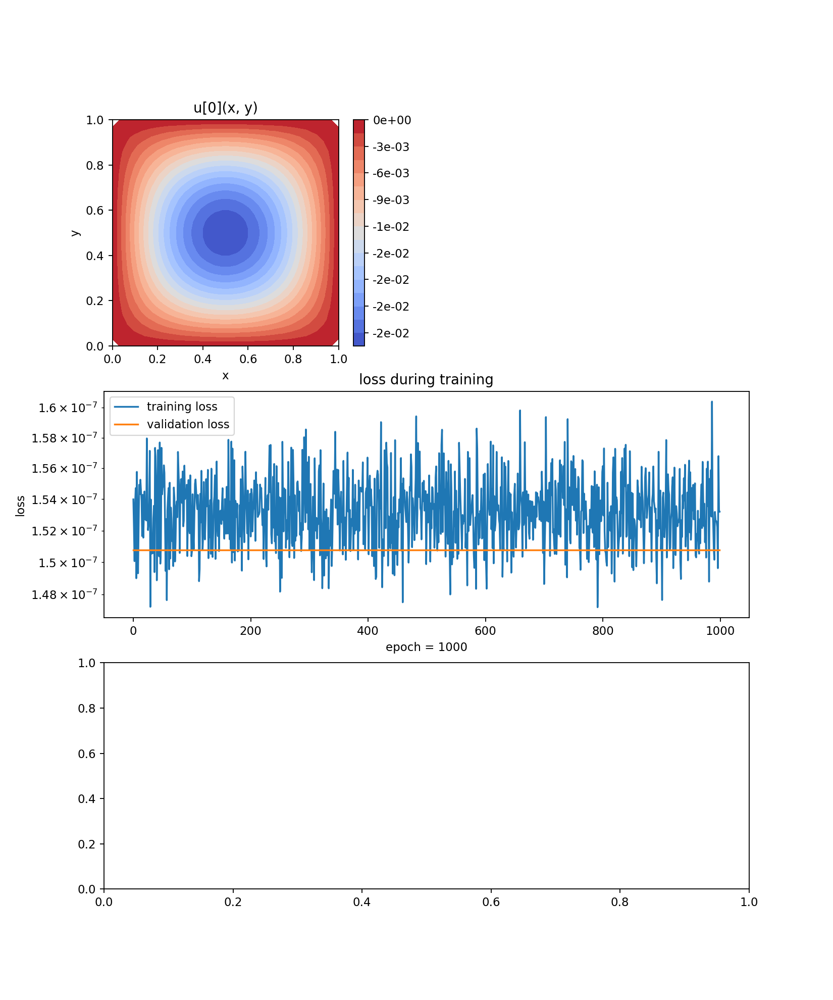

In [86]:
k = 1

solver1 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_f1), lr=0.1),
)

solver1.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson1 = solver1.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


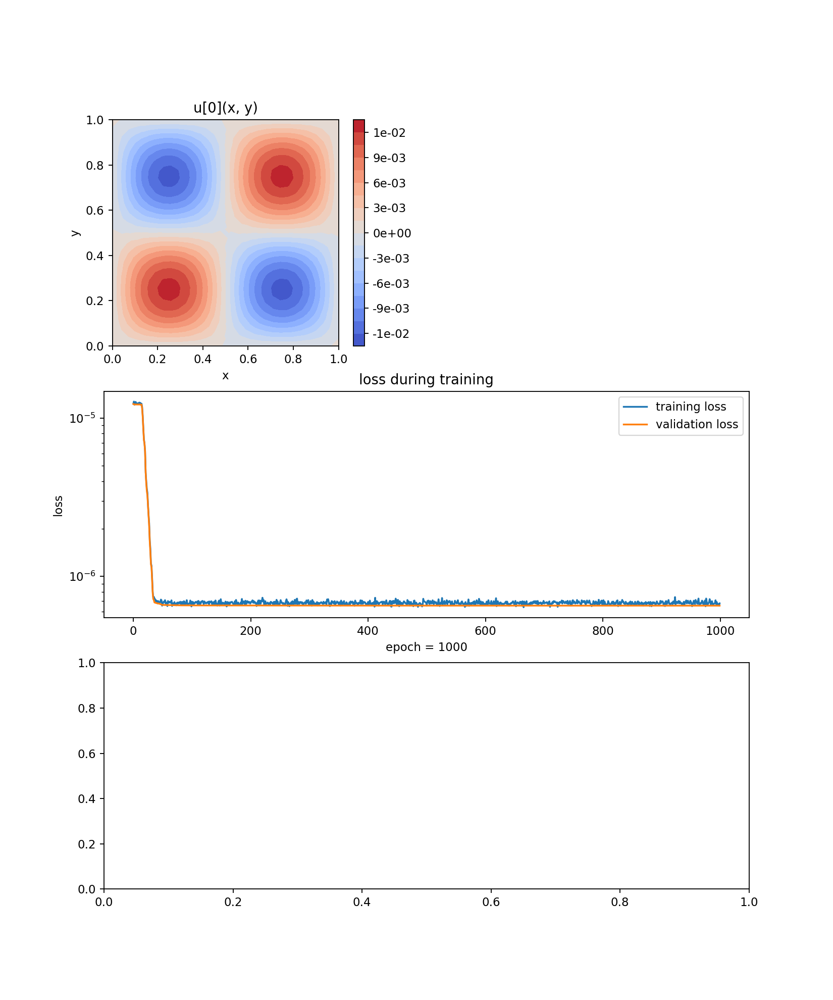

In [87]:
k = 2

solver2 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f2,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_f2), lr=0.1),
)

solver2.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson2 = solver2.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


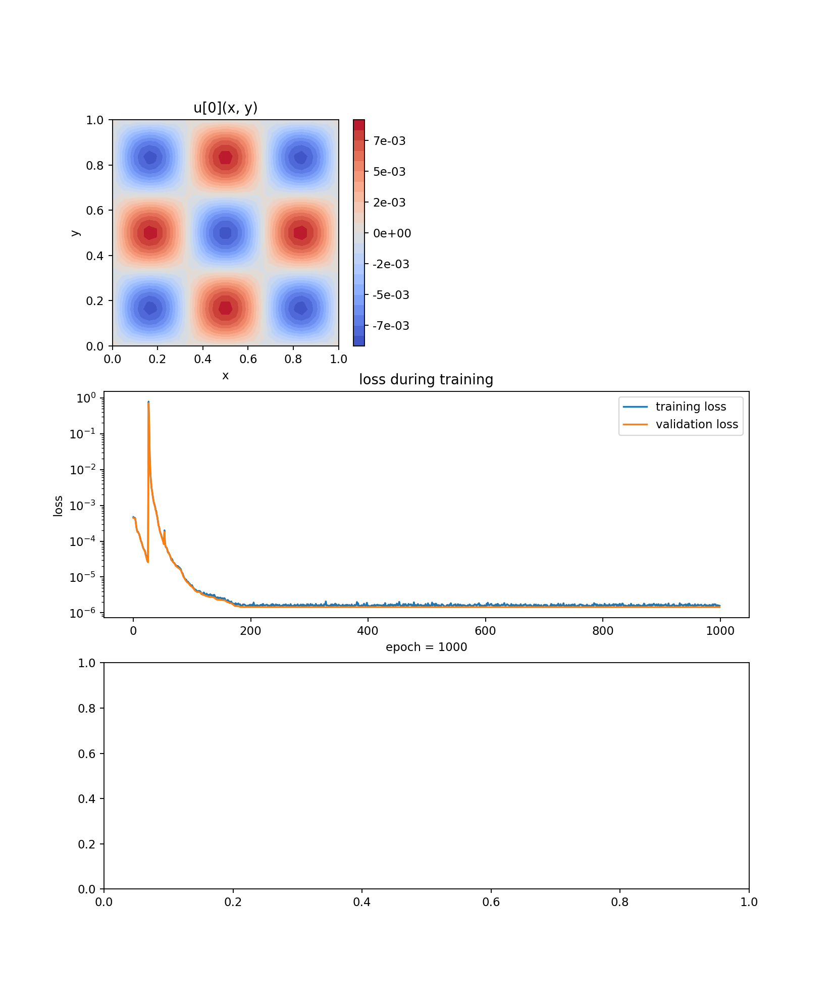

In [88]:
k = 3

solver3 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f3,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_f3), lr=0.1),
)

solver3.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson3 = solver3.get_solution()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


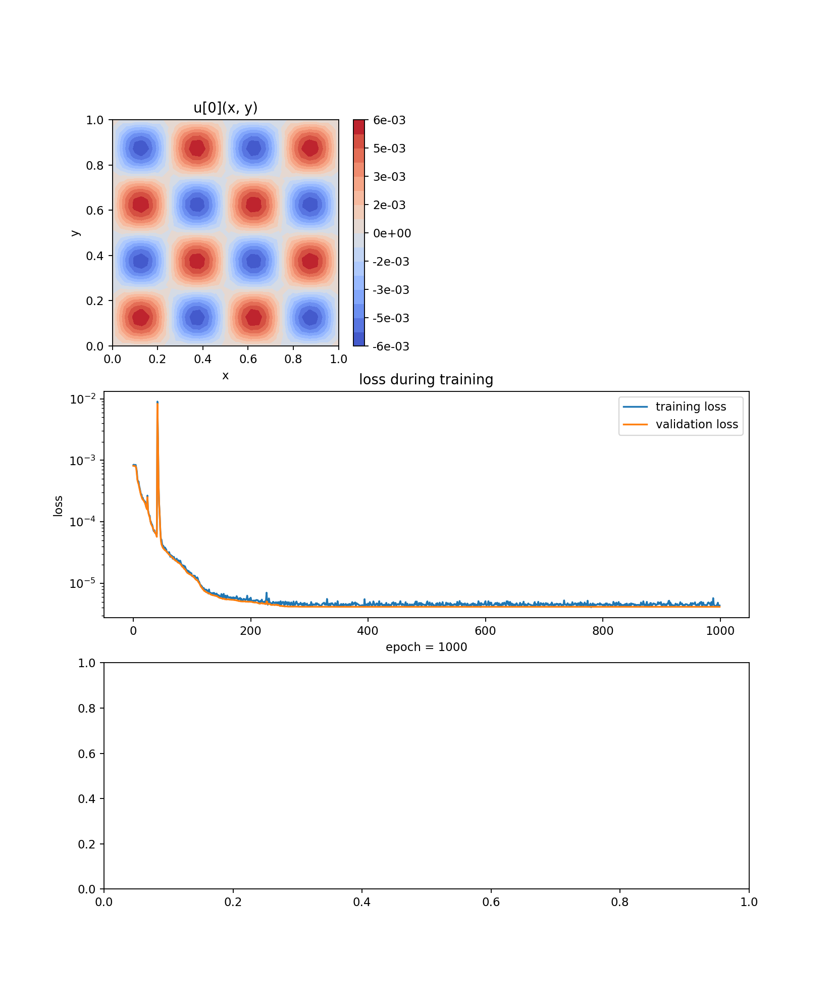

In [78]:
k = 4

solver4 = Solver2D(
    pde_system=poisson1,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_f4,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_f4), lr=0.1),
)

solver4.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson4 = solver4.get_solution()

In [92]:
loss1_continue = solver1.metrics_history
loss1_integrated = loss1_adam['valid_loss'] + loss1_continue['valid_loss']
print(loss1_integrated)

[0.03268312621964711, 0.015135383627961699, 0.007560736457513293, 0.008095819813918197, 0.012655754804832007, 0.015794318335443362, 0.015585789380940296, 0.013149079594679713, 0.010191123600173352, 0.007908675350473283, 0.006804860205965187, 0.006815509400924439, 0.007536878678162507, 0.008457868422378867, 0.009157038125463257, 0.00942047367412309, 0.009234569658739226, 0.00871801730620692, 0.008044879847890794, 0.007385256778663944, 0.006873844206959129, 0.006583746860473423, 0.006524121918571487, 0.006644817459618642, 0.006855257916764744, 0.007055502229674502, 0.007165839155517034, 0.007149164628919999, 0.007017364905308928, 0.00681634207972835, 0.0066045344768946345, 0.006433026958206691, 0.006329448434726686, 0.006296687559651457, 0.006317430870702807, 0.006363113434043903, 0.006403199173379675, 0.006414616670895903, 0.006386502968291412, 0.006320401806751668, 0.006229492088519607, 0.006131524847937708, 0.006044307326789145, 0.005980587973209675, 0.005943488727850181, 0.0059266365

In [93]:
loss2_continue = solver2.metrics_history
loss2_integrated = loss2_adam['valid_loss'] + loss2_continue['valid_loss']
print(loss2_integrated)

[0.23419377395214497, 0.23220106389109293, 0.23221989641537633, 0.2311791500263927, 0.22990016676281966, 0.22926338407159358, 0.2283736097383129, 0.22690117740168025, 0.22548442066140803, 0.22430425102575202, 0.22262629668942144, 0.22046550550053998, 0.21850688718413178, 0.2163394575976456, 0.21339229297532594, 0.21047167117160914, 0.2073539901582546, 0.20315498810865973, 0.19902156891931447, 0.19429694677221343, 0.18875693026884996, 0.18326854980680984, 0.1763817875252825, 0.16965393007164858, 0.16161138925830082, 0.15357350670207587, 0.14449810998411944, 0.13500930760482255, 0.1256022453465978, 0.11548732151654674, 0.1053940415367341, 0.09553696705654459, 0.08625286235392964, 0.0778414042024996, 0.07089150580287187, 0.06932038665147956, 0.09066640432853595, 0.06559235760052644, 0.08506722322007228, 0.06348632723252007, 0.08537420863348515, 0.064959688709434, 0.08018000151114402, 0.07079422724334417, 0.06932584485593318, 0.07572502364735367, 0.063674606573561, 0.07144596485404203, 0.0

In [94]:
loss3_continue = solver3.metrics_history
loss3_integrated = loss3_adam['valid_loss'] + loss3_continue['valid_loss']
print(loss3_integrated)

[0.5312681864036115, 0.528024601977207, 0.5282089652349818, 0.5293258192833371, 0.5287603140027974, 0.5279059650490132, 0.5277243372919372, 0.5280274163870762, 0.5283330842276602, 0.5282435604038322, 0.5278900929336556, 0.5276828837031426, 0.5277333318857119, 0.527876012997023, 0.5279214769738111, 0.527840406965377, 0.5276855489010479, 0.5276100840025704, 0.5276341289838858, 0.5277274811547488, 0.5277587529968416, 0.5276837384640818, 0.5275952239810965, 0.527557910651416, 0.5275957205269983, 0.5276441731716469, 0.5276269721373585, 0.527554327213095, 0.5275013720218149, 0.5274849915652311, 0.5274927947620341, 0.5274960332000681, 0.5274740468796146, 0.5274474169055369, 0.5274226529773298, 0.5273998770849673, 0.5273994393516617, 0.5274045599370183, 0.5273679935930624, 0.5273320677192135, 0.5273554416317716, 0.527383639300868, 0.5273475994054977, 0.5272750822917616, 0.5272511106174862, 0.5272911909843652, 0.5273262755990158, 0.5272616488017412, 0.5271776203370784, 0.5271502788890433, 0.527

In [95]:
loss4_continue = solver4.metrics_history
loss4_integrated = loss4_adam['valid_loss'] + loss4_continue['valid_loss']
print(loss4_integrated)

[0.939192593264151, 0.9390301911363893, 0.9388320597828101, 0.9383828144830875, 0.9386479297287755, 0.938567881601519, 0.9383901946098092, 0.9384280329477261, 0.9386279379474514, 0.9386010815272421, 0.938297982925488, 0.9383712015295281, 0.9385267244827755, 0.9384796737989327, 0.9382778964515666, 0.938225211529192, 0.9382720322034765, 0.9382198460372256, 0.9381702375778382, 0.9382830264904509, 0.9384067059954546, 0.9383795240148105, 0.9382395074376544, 0.9381525060766109, 0.9381593919451419, 0.9381207904936107, 0.938039997854104, 0.9380850894250361, 0.9381173689800432, 0.938059905153244, 0.9381575454186699, 0.938480085434124, 0.9383060115295179, 0.9380517151243555, 0.938153133351927, 0.9384456068447692, 0.9381194353692293, 0.9378564951924518, 0.9380687262073404, 0.9383305442413241, 0.9381316045230227, 0.9379556368382267, 0.9380841319563932, 0.9380603780288274, 0.9377994146426148, 0.9377348231669664, 0.9378699909458421, 0.9378859993202724, 0.9377577204449872, 0.9377492623018453, 0.93781

In [96]:
color_name = 'Set2' #官方色组名称

# 法一：在jupyter`在这里插入代码片` notebook中可以这样查看
plt.get_cmap(color_name)

In [100]:
plt.figure()
plt.plot(loss1_integrated, label='k = 1, time = 08:01',linewidth =1.2, color = plt.get_cmap(color_name)(0.1))
plt.plot(loss2_integrated, label='k = 2, time = 09:06',linewidth =1.2, color = plt.get_cmap(color_name)(0.2))
plt.plot(loss3_integrated, label='k = 3, time = 12:32',linewidth =1.2, color = plt.get_cmap(color_name)(0.35))
plt.plot(loss4_integrated, label='k = 4, time = 14:14',linewidth =1.2, color = plt.get_cmap(color_name)(0.45))
plt.yscale('log')
plt.legend(fontsize='small')
plt.show()

<IPython.core.display.Javascript object>

# Findings
* Frequency-principle is valid, that a deep neural network will fit target functions from low to high frequencies during the training process. Specific comparisons are shown in the table below:
* Indeed the L-BGFS-B could go to the wrong function quickly. Integrated PDE solvers train the PiNNs with Adam optimizer for 5000 epochs, to assure the correct descent direction, followed by 1000-epoch training with L-BGFS-B optimizer where the trial solution converge much faster and enjoy better accuracy. Such combination will provide higher computational performance. But can it be comparable with traditional PDE solvers?

In [117]:
from scipy.interpolate import interp2d

# f will be a function with two arguments (x and y coordinates),
# but those can be array_like structures too, in which case the
# result will be a matrix representing the values in the grid 
# specified by those arguments
xs = np.linspace(0, 1, 1001)
ts = np.linspace(0, 1, 1001)
xx, tt = np.meshgrid(xs, ts)

<IPython.core.display.Javascript object>


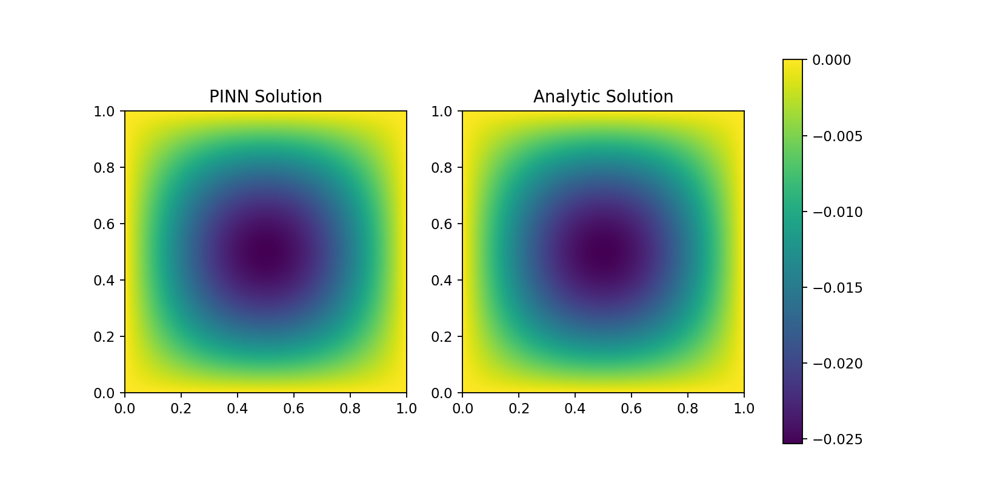

In [118]:
solution_analytic1 = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi*np.pi)
sol_ana = solution_analytic1(xx, tt)
sol_net = solution_poisson1(xx, tt, to_numpy=True)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the analytical solution in the first subplot
im1 = axs[0].imshow(sol_net, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0].set_title('PINN Solution')

# Plot the analytical solution in the second subplot
im2 = axs[1].imshow(sol_ana, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1].set_title('Analytic Solution')

# Show the positions of the sample points in both subplots, just to have some reference
axs[0].scatter(xx, tt, 500, facecolors='none')
axs[1].scatter(xx, tt, 500, facecolors='none')

# Add a colorbar to the figure
fig.colorbar(im1, ax=axs)

# Show the figure
plt.show()

<IPython.core.display.Javascript object>


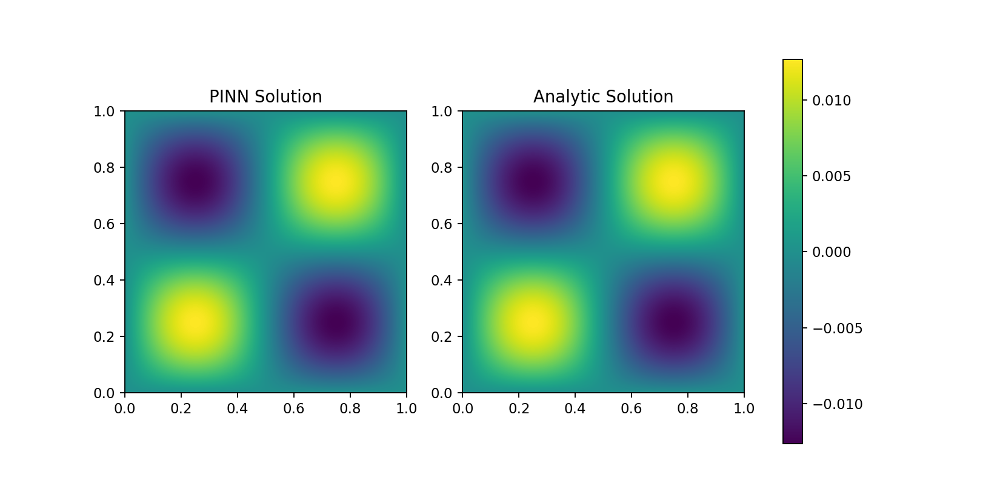

In [119]:
solution_analytic2 = lambda x, t: np.sin(2*np.pi*x)*np.sin(2*np.pi*t)/(8*np.pi*np.pi)
sol_ana = solution_analytic2(xx, tt)
sol_net = solution_poisson2(xx, tt, to_numpy=True)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the analytical solution in the first subplot
im1 = axs[0].imshow(sol_net, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0].set_title('PINN Solution')

# Plot the analytical solution in the second subplot
im2 = axs[1].imshow(sol_ana, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1].set_title('Analytic Solution')

# Show the positions of the sample points in both subplots, just to have some reference
axs[0].scatter(xx, tt, 500, facecolors='none')
axs[1].scatter(xx, tt, 500, facecolors='none')

# Add a colorbar to the figure
fig.colorbar(im1, ax=axs)

# Show the figure
plt.show()

<IPython.core.display.Javascript object>


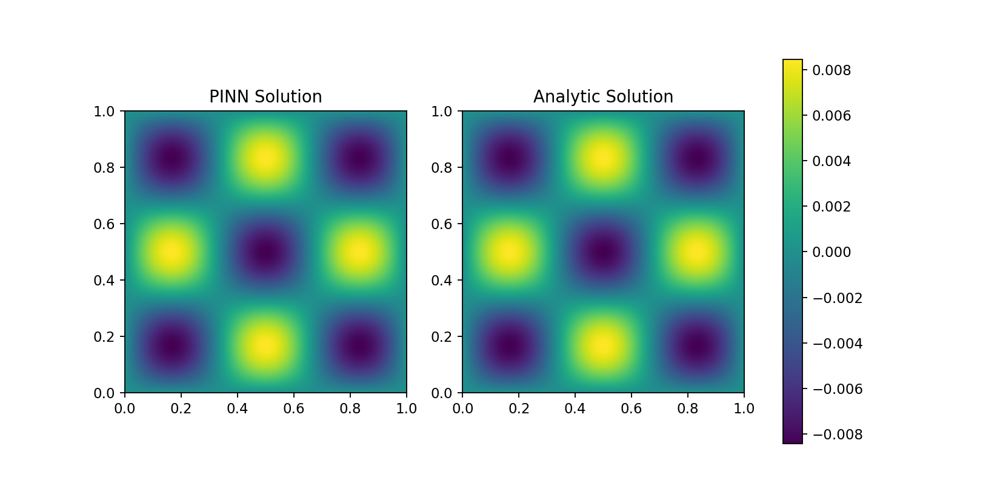

In [120]:
solution_analytic3 = lambda x, t: -np.sin(3*np.pi*x)*np.sin(3*np.pi*t)/(12*np.pi*np.pi)
sol_ana = solution_analytic3(xx, tt)
sol_net = solution_poisson3(xx, tt, to_numpy=True)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the analytical solution in the first subplot
im1 = axs[0].imshow(sol_net, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0].set_title('PINN Solution')

# Plot the analytical solution in the second subplot
im2 = axs[1].imshow(sol_ana, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1].set_title('Analytic Solution')

# Show the positions of the sample points in both subplots, just to have some reference
axs[0].scatter(xx, tt, 500, facecolors='none')
axs[1].scatter(xx, tt, 500, facecolors='none')

# Add a colorbar to the figure
fig.colorbar(im1, ax=axs)

# Show the figure
plt.show()

<IPython.core.display.Javascript object>


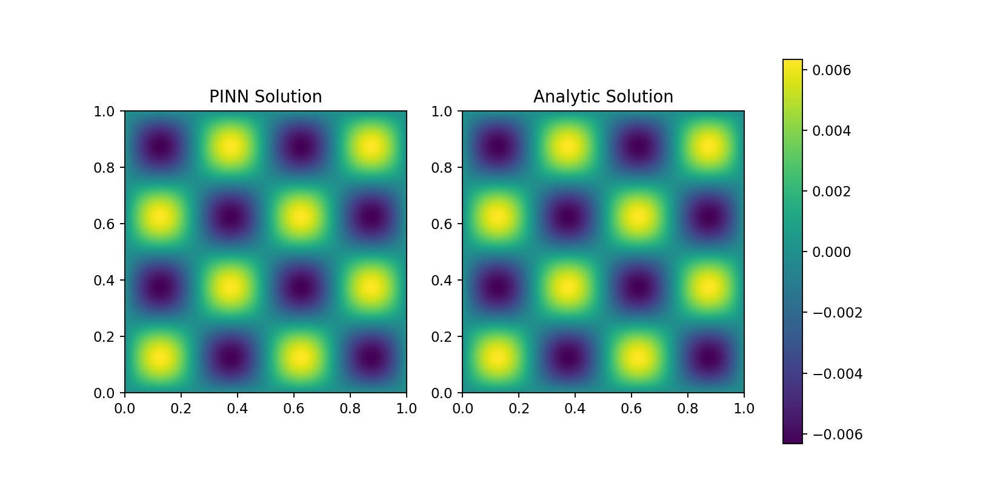

In [121]:
solution_analytic4 = lambda x, t: np.sin(4*np.pi*x)*np.sin(4*np.pi*t)/(16*np.pi*np.pi)
sol_ana = solution_analytic4(xx, tt)
sol_net = solution_poisson4(xx, tt, to_numpy=True)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the analytical solution in the first subplot
im1 = axs[0].imshow(sol_net, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0].set_title('PINN Solution')

# Plot the analytical solution in the second subplot
im2 = axs[1].imshow(sol_ana, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1].set_title('Analytic Solution')

# Show the positions of the sample points in both subplots, just to have some reference
axs[0].scatter(xx, tt, 500, facecolors='none')
axs[1].scatter(xx, tt, 500, facecolors='none')

# Add a colorbar to the figure
fig.colorbar(im1, ax=axs)

# Show the figure
plt.show()

# Animation on loss and trial solution

Now, we wish empirically compare the computational performance of PiNNs with different configurations, trying to optimize the training cost by adjusting its hyperparameters (layers, neurons, activation functions, training points generators, and epochs). 

We can use `make_animation` to animate the solution. Here we also check the residual of our solution.

Here we create a function to help us visualize the shape of the solution and the residual.

In [101]:
from mpl_toolkits.mplot3d  import Axes3D
def plt_surf(xx, yy, zz, z_label='u', x_label='x', y_label='y', title=''):
    fig  = plt.figure(figsize=(16, 8))
    ax   = Axes3D(fig)
    surf = ax.plot_surface(xx, yy, zz, rstride=2, cstride=1, alpha=0.8, cmap='hot')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    fig.suptitle(title)
    ax.set_proj_type('ortho')
    plt.show()

In [102]:
xs = np.linspace(0, 1, 101)
ts = np.linspace(0, 1, 101) 
xx, tt = np.meshgrid(xs, ts)

## component with frequency k = 1

<IPython.core.display.Javascript object>


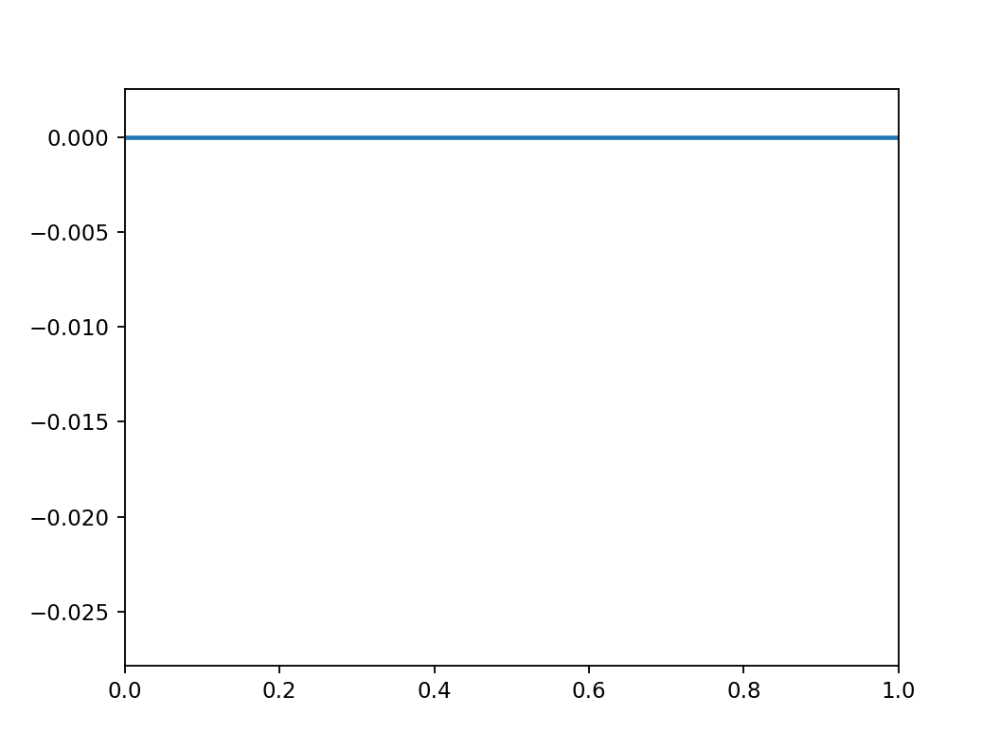

In [103]:
make_animation(solution_poisson1, xs, ts)

<IPython.core.display.Javascript object>


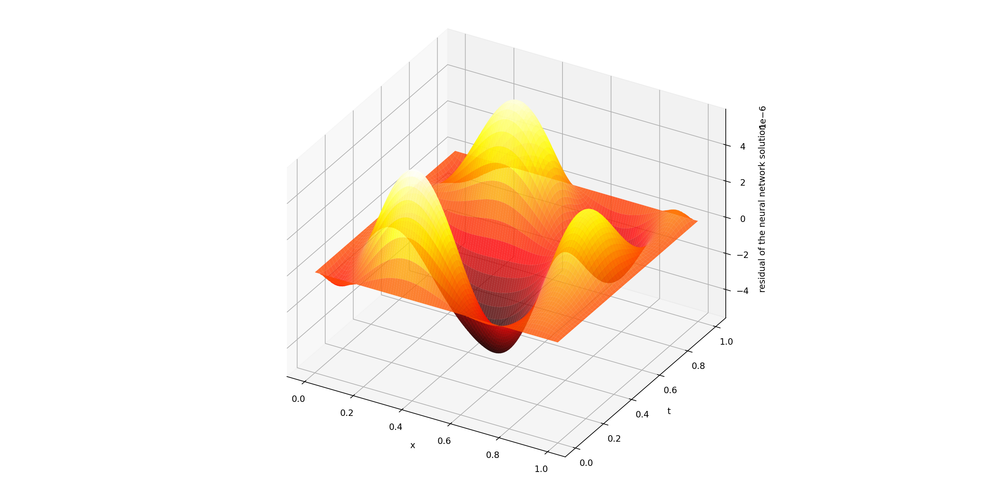

In [104]:
solution_analytical_1 = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi**2)
sol_ana1 = solution_analytical_1(xx, tt)
sol_net1 = solution_poisson1(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net1-sol_ana1, y_label='t', z_label='residual of the neural network solution')

## component with frequency k = 2

<IPython.core.display.Javascript object>


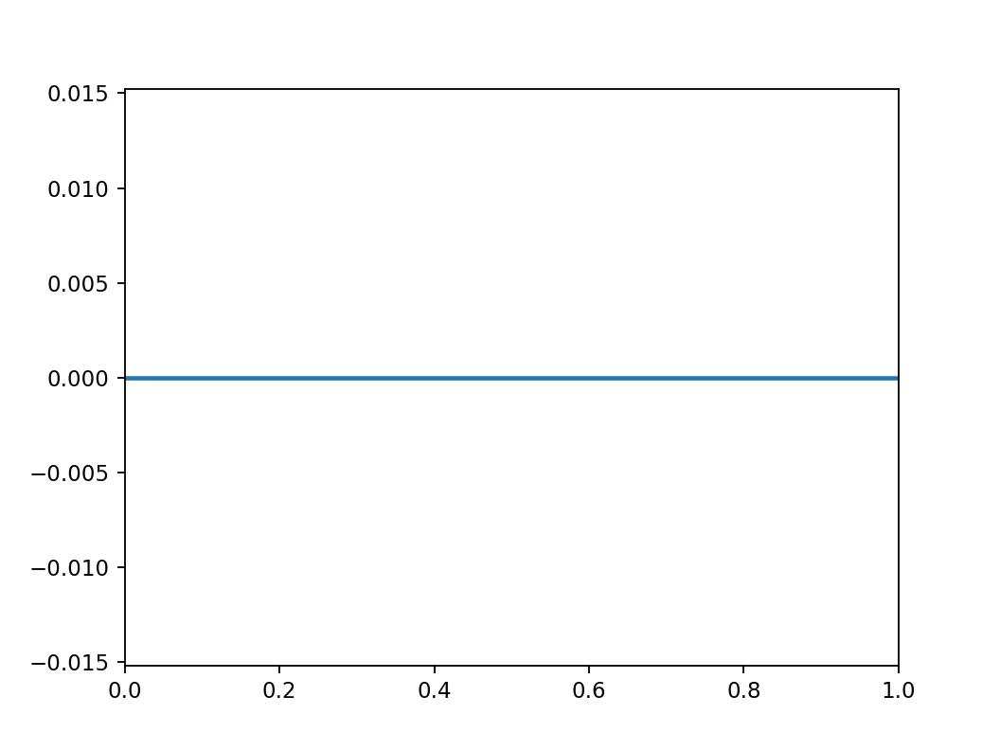

In [105]:
make_animation(solution_poisson2, xs, ts)

<IPython.core.display.Javascript object>


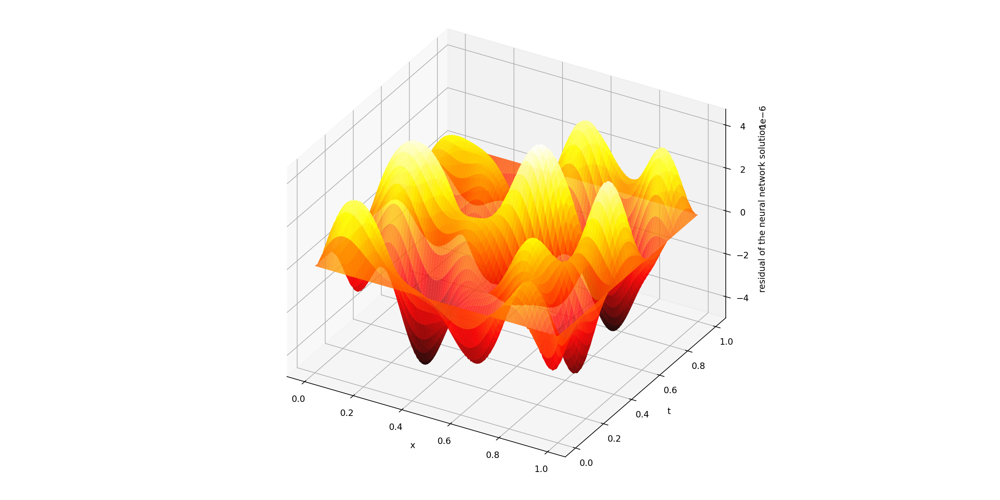

In [106]:
solution_analytical_2 = lambda x, t: np.sin(2*np.pi*x)*np.sin(2*np.pi*t)/(8*np.pi**2)
sol_ana2 = solution_analytical_2(xx, tt)
sol_net2 = solution_poisson2(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net2-sol_ana2, y_label='t', z_label='residual of the neural network solution')

## component with frequency k = 3

<IPython.core.display.Javascript object>


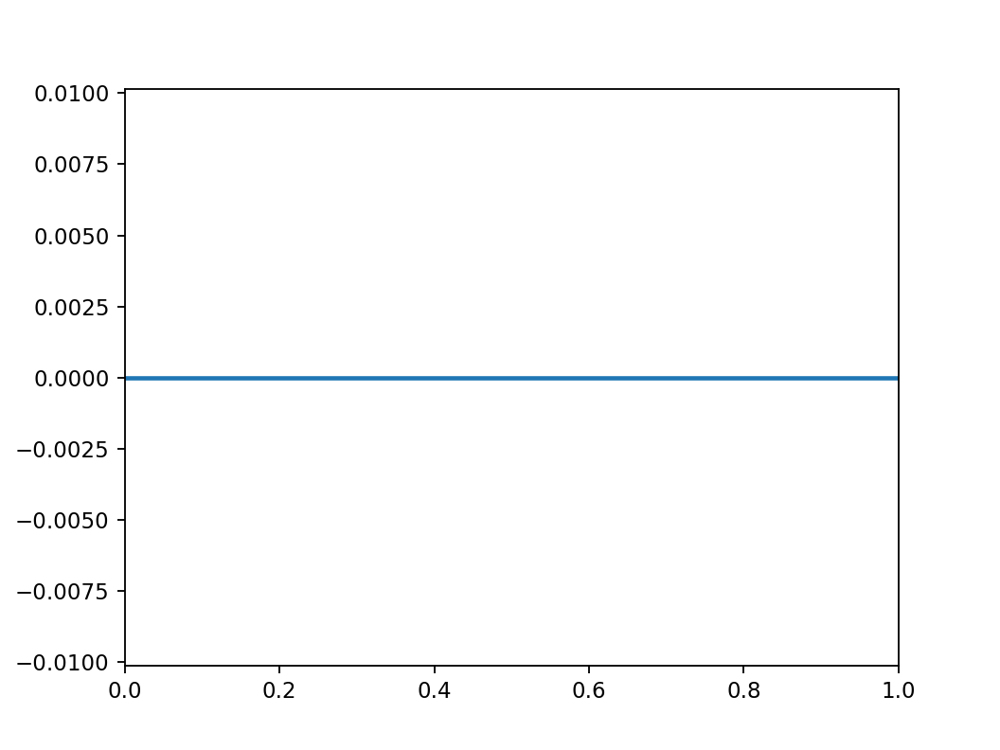

In [107]:
make_animation(solution_poisson3, xs, ts)

<IPython.core.display.Javascript object>


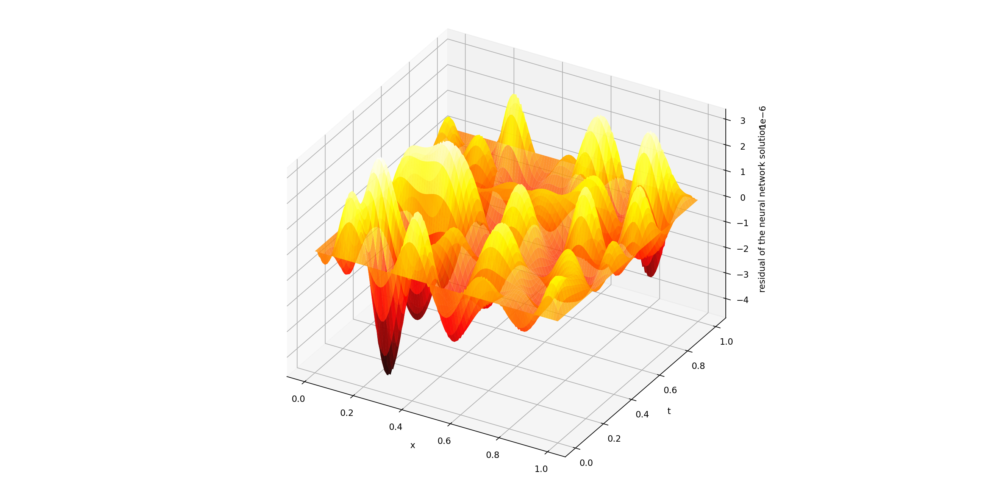

In [108]:
solution_analytical_3 = lambda x, t: -np.sin(3*np.pi*x)*np.sin(3*np.pi*t)/(12*np.pi**2)
sol_ana3 = solution_analytical_3(xx, tt)
sol_net3 = solution_poisson3(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net3-sol_ana3, y_label='t', z_label='residual of the neural network solution')

## component with frequency k = 4

<IPython.core.display.Javascript object>


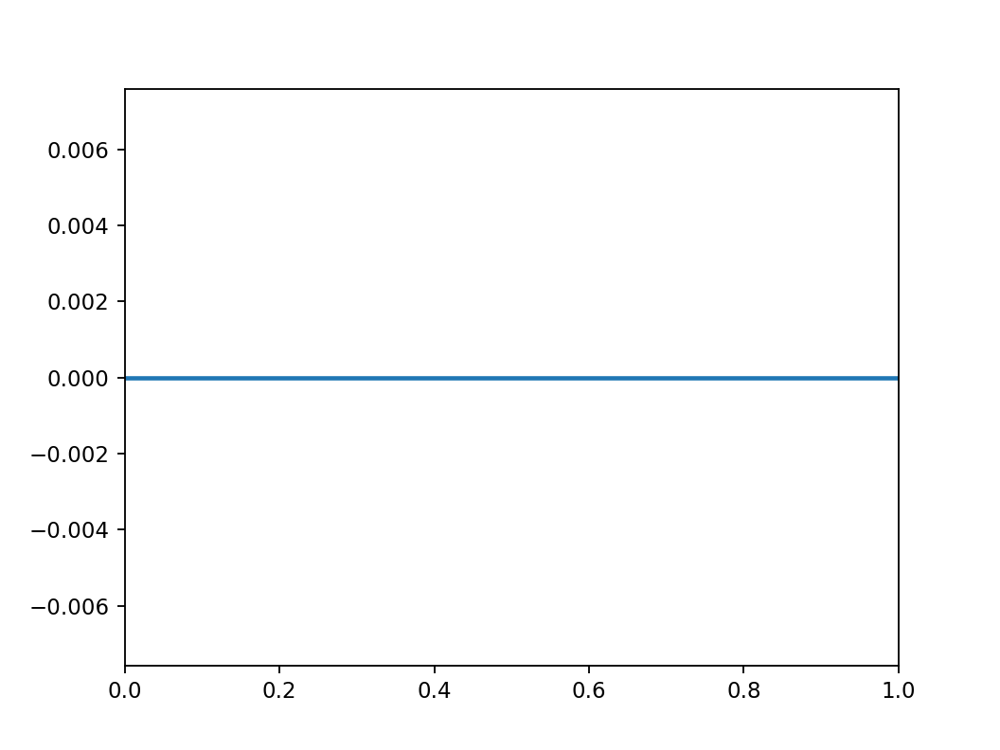

In [109]:
make_animation(solution_poisson4, xs, ts)

<ipython-input-101-b4f10f223bda>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig  = plt.figure(figsize=(16, 8))


<IPython.core.display.Javascript object>


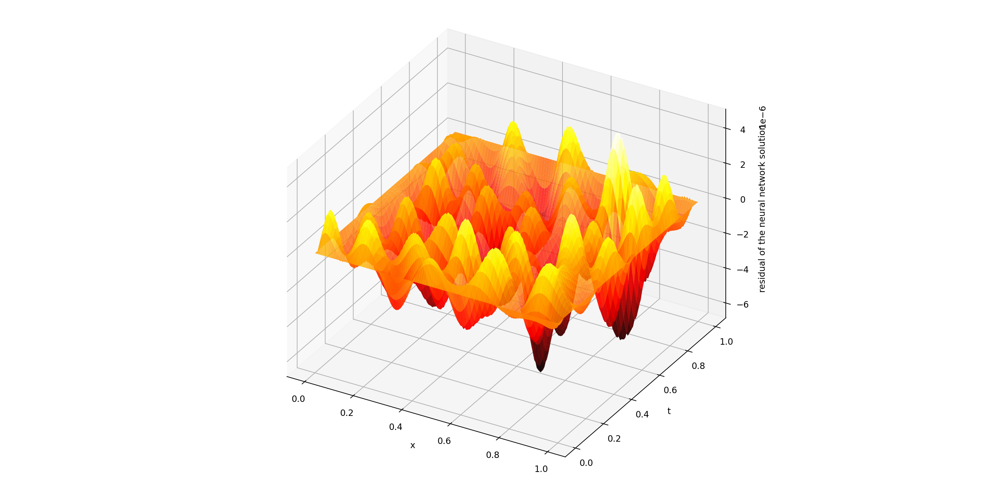

In [110]:
solution_analytical_4 = lambda x, t: np.sin(4*np.pi*x)*np.sin(4*np.pi*t)/(16*np.pi**2)
sol_ana4 = solution_analytical_4(xx, tt)
sol_net4 = solution_poisson4(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net4-sol_ana4, y_label='t', z_label='residual of the neural network solution')

## The whole function
By the superposition law, we add components with frequency number k = 1, 2, 3, 4.

In [143]:
poisson2 = lambda u, x, y: [diff(u, x, order=2) + diff(u, y, order=2) - 0.5 * (-1)**(2)  * torch.sin(np.pi*x) * torch.sin(np.pi*y) - 0.5 * (-1)**(2+1) * 2 * torch.sin(2*np.pi*x) * torch.sin(2*np.pi*y) - 0.5 * (-1)**(3+1) * 3 * torch.sin(3*np.pi*x) * torch.sin(3*np.pi*y) - 0.5 * (-1)**(4+1) * 4 * torch.sin(4*np.pi*x) * torch.sin(4*np.pi*y)]

# Define the boundary conditions
# There's only one function to be solved for, so we only have a single condition
conditions = [
    DirichletBVP2D(
        x_min=0, x_min_val=lambda y: 0, 
        x_max=1, x_max_val=lambda y: 0, 
        y_min=0, y_min_val=lambda x: 0, 
        y_max=1, y_max_val=lambda x: 0,
    )
]

# Define the monitor callback
monitor=Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1))
monitor_callback = monitor.to_callback()

train_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced-noisy')
valid_gen=Generator2D((32, 32), (0, 0), (1, 1), method='equally-spaced')

#Create independent neural networks with the different configuration to simulate our trail solutions

Training Progress:   0%|                                                                       | 0/100 [00:00<…

<IPython.core.display.Javascript object>


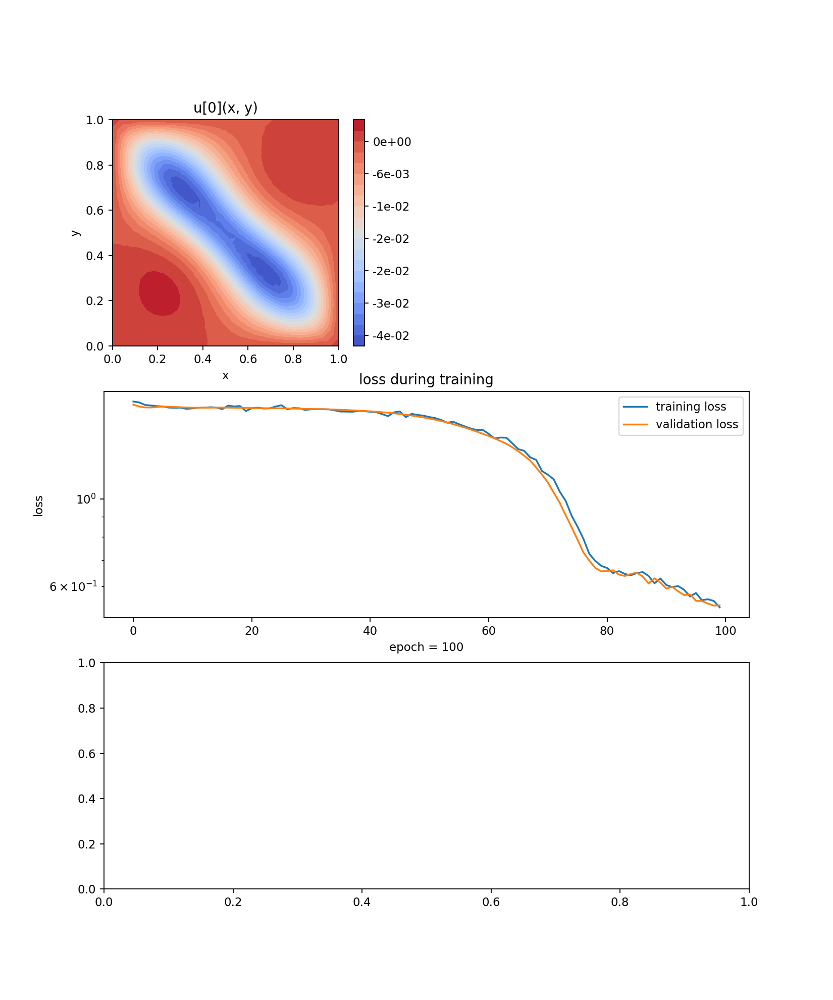

In [150]:
from itertools import chain
from torch.optim import LBFGS
nets_lr1 = copy.deepcopy(net_origin)
nets_lr2 = copy.deepcopy(net_origin)
nets_lr3 = copy.deepcopy(net_origin)
nets_lr4 = copy.deepcopy(net_origin)
nets_lr5 = copy.deepcopy(net_origin)


solver_adam1 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr1,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_adam1.fit(max_epochs=100, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_adam1 = solver_adam1.get_solution()

In [151]:
solver_adam2 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr2,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_adam2.fit(max_epochs=400, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_adam2 = solver_adam2.get_solution()

Training Progress:   0%|                                                                       | 0/400 [00:00<…

<IPython.core.display.Javascript object>

Training Progress:   0%|                                                                       | 0/800 [00:00<…

<IPython.core.display.Javascript object>


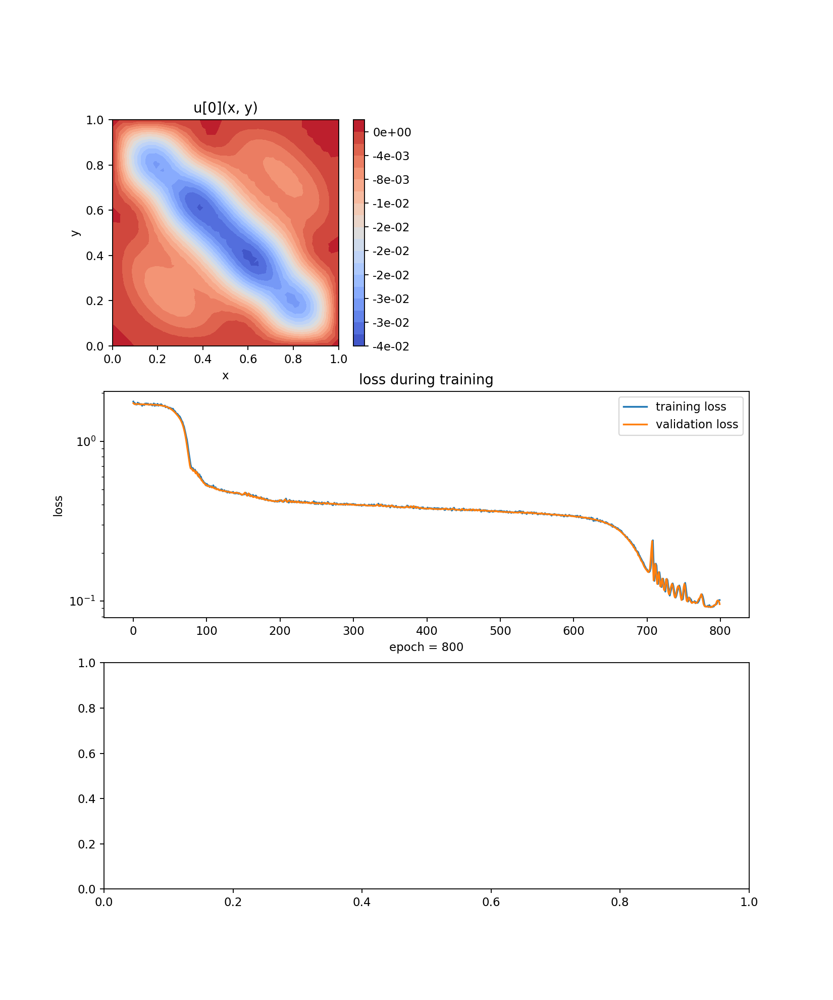

In [152]:
solver_adam3 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr3,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_adam3.fit(max_epochs=800, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_adam3 = solver_adam3.get_solution()

Training Progress:   0%|                                                                      | 0/1200 [00:00<…

<IPython.core.display.Javascript object>


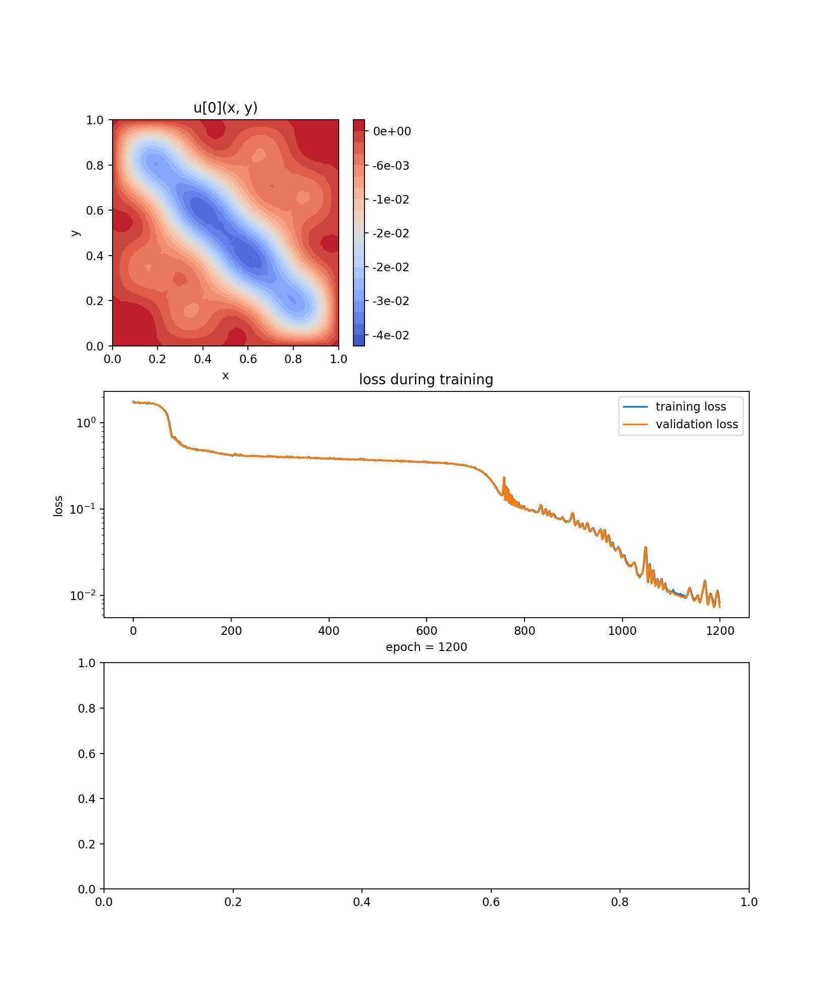

In [153]:
solver_adam4 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr4,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_adam4.fit(max_epochs=1200, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_adam4 = solver_adam4.get_solution()

Training Progress:   0%|                                                                      | 0/1600 [00:00<…

<IPython.core.display.Javascript object>


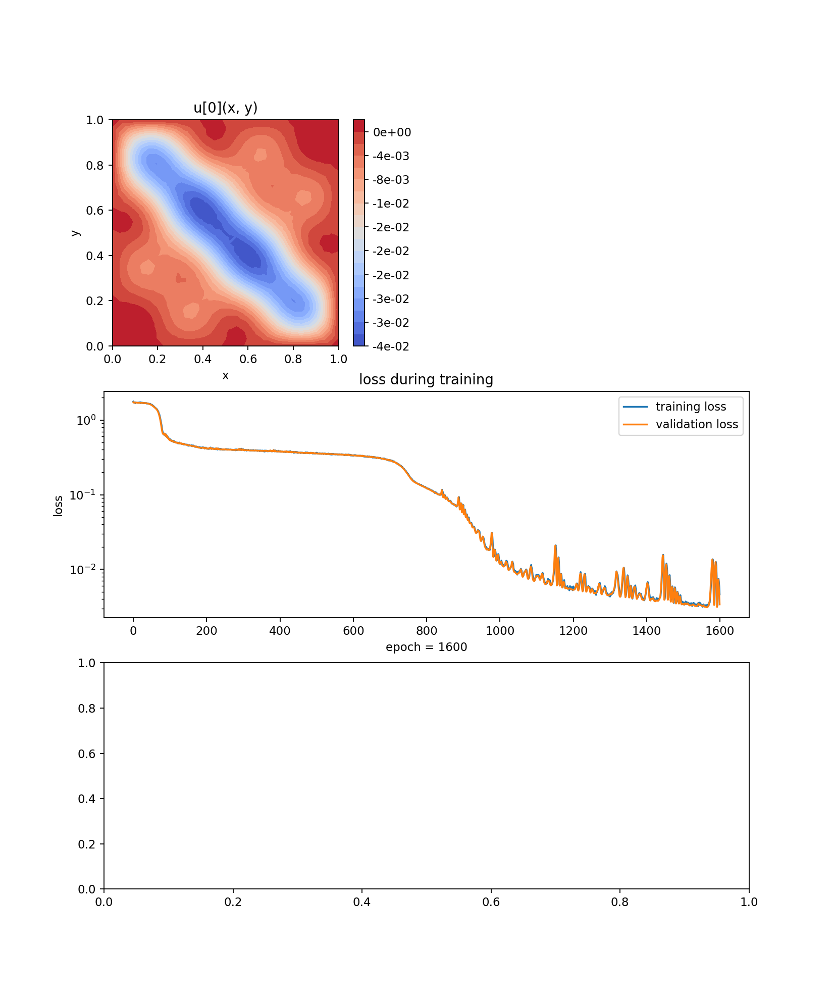

In [154]:
solver_adam5 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr5,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_adam5.fit(max_epochs=1600, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_adam5 = solver_adam5.get_solution()

Training Progress:   0%|                                                                        | 0/10 [00:00<…

<IPython.core.display.Javascript object>


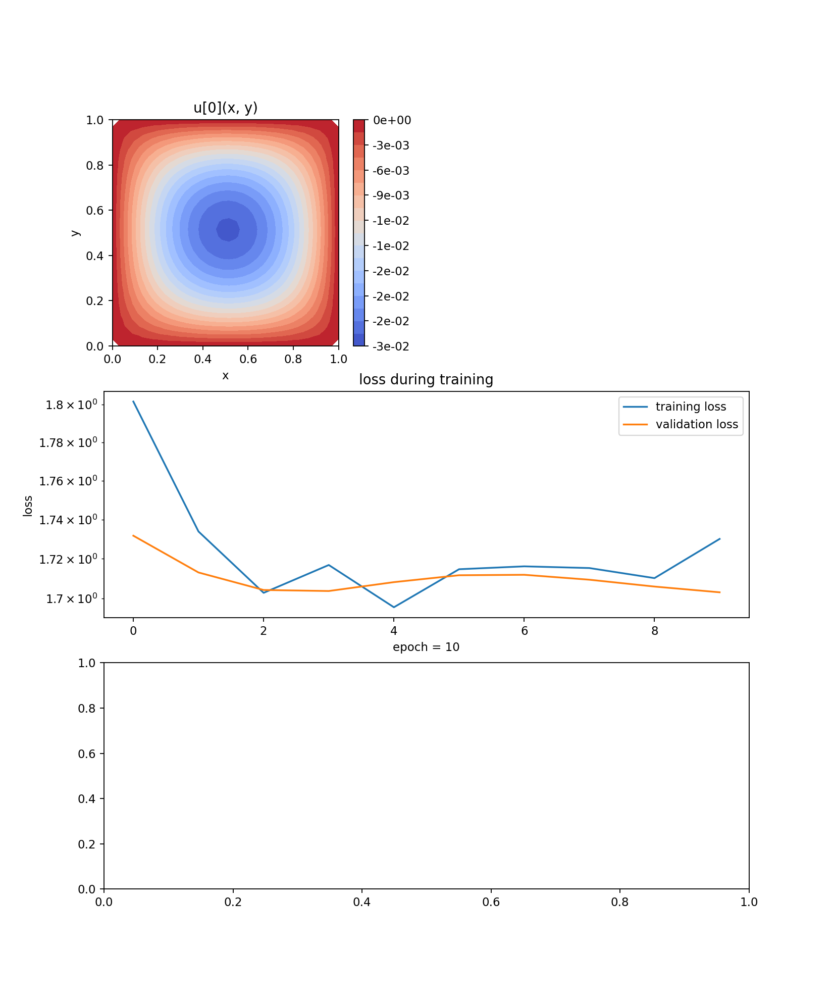

In [160]:
nets_lr6 = copy.deepcopy(net_origin)

solver_adam6 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr6,
    train_generator=train_gen,
    valid_generator=valid_gen,
)

solver_adam6.fit(max_epochs=10, callbacks=[Monitor2D(check_every=10, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_adam6 = solver_adam6.get_solution()

<IPython.core.display.Javascript object>


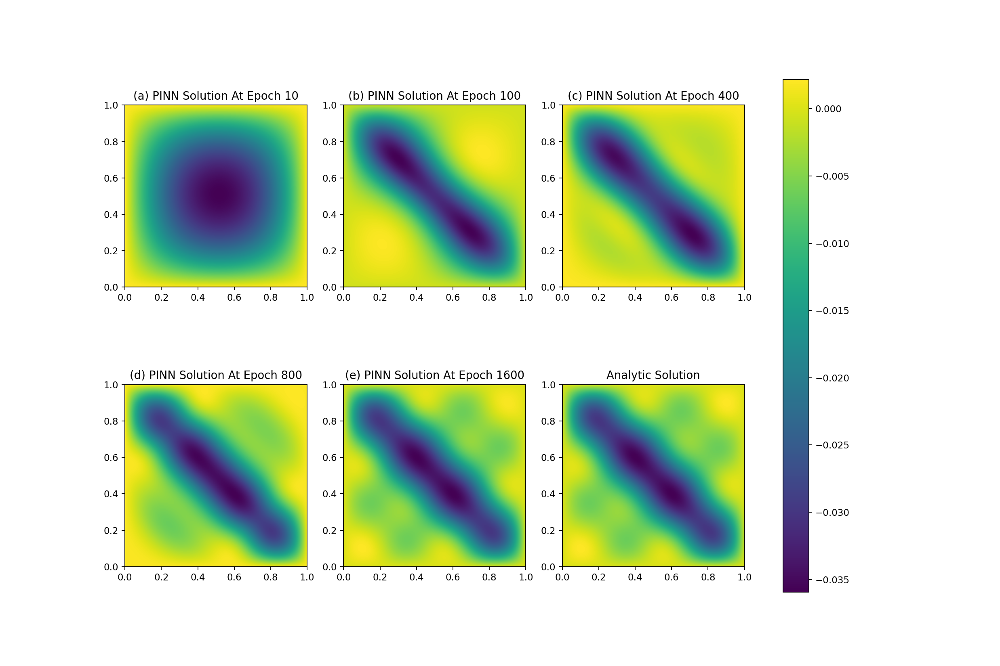

In [159]:
solution_analytic = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi**2)+np.sin(2*np.pi*x)*np.sin(2*np.pi*t)/(8*np.pi**2)-np.sin(3*np.pi*x)*np.sin(3*np.pi*t)/(12*np.pi**2)+np.sin(4*np.pi*x)*np.sin(4*np.pi*t)/(16*np.pi**2)
sol_ana = solution_analytic(xx, tt)
sol_net1 = solution_poisson_adam6(xx, tt, to_numpy=True)
sol_net2 = solution_poisson_adam1(xx, tt, to_numpy=True)
sol_net3 = solution_poisson_adam2(xx, tt, to_numpy=True)
sol_net4 = solution_poisson_adam3(xx, tt, to_numpy=True)
sol_net5 = solution_poisson_adam5(xx, tt, to_numpy=True)

# Create a figure with 6 subplots
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Plot the analytical solution in the first subplot
im1 = axs[0, 0].imshow(sol_net1, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0, 0].set_title('(a) PINN Solution At Epoch 10')

# Plot the analytical solution in the second subplot
im2 = axs[0, 1].imshow(sol_net2, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0, 1].set_title('(b) PINN Solution At Epoch 100')

# Plot the analytical solution in the second subplot
im3 = axs[0, 2].imshow(sol_net3, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[0, 2].set_title('(c) PINN Solution At Epoch 400')

# Plot the analytical solution in the second subplot
im4 = axs[1, 0].imshow(sol_net4, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1, 0].set_title('(d) PINN Solution At Epoch 800')

# Plot the analytical solution in the second subplot
im5 = axs[1, 1].imshow(sol_net5, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1, 1].set_title('(e) PINN Solution At Epoch 1600')

# Plot the analytical solution in the second subplot
im6 = axs[1, 2].imshow(sol_ana, extent=[min(xs), max(xs), min(ts), max(ts)], origin="lower")
axs[1, 2].set_title('Analytic Solution')

# Show the positions of the sample points in all subplots, just to have some reference
axs[0, 0].scatter(xx, tt, 500, facecolors='none')
axs[0, 1].scatter(xx, tt, 500, facecolors='none')
axs[0, 2].scatter(xx, tt, 500, facecolors='none')
axs[1, 0].scatter(xx, tt, 500, facecolors='none')
axs[1, 1].scatter(xx, tt, 500, facecolors='none')
axs[1, 2].scatter(xx, tt, 500, facecolors='none')

# Add a colorbar to the figure
fig.colorbar(im6, ax=axs)

# Show the figure
plt.show()

Training Progress:   0%|                                                                      | 0/1000 [00:00<…

<IPython.core.display.Javascript object>


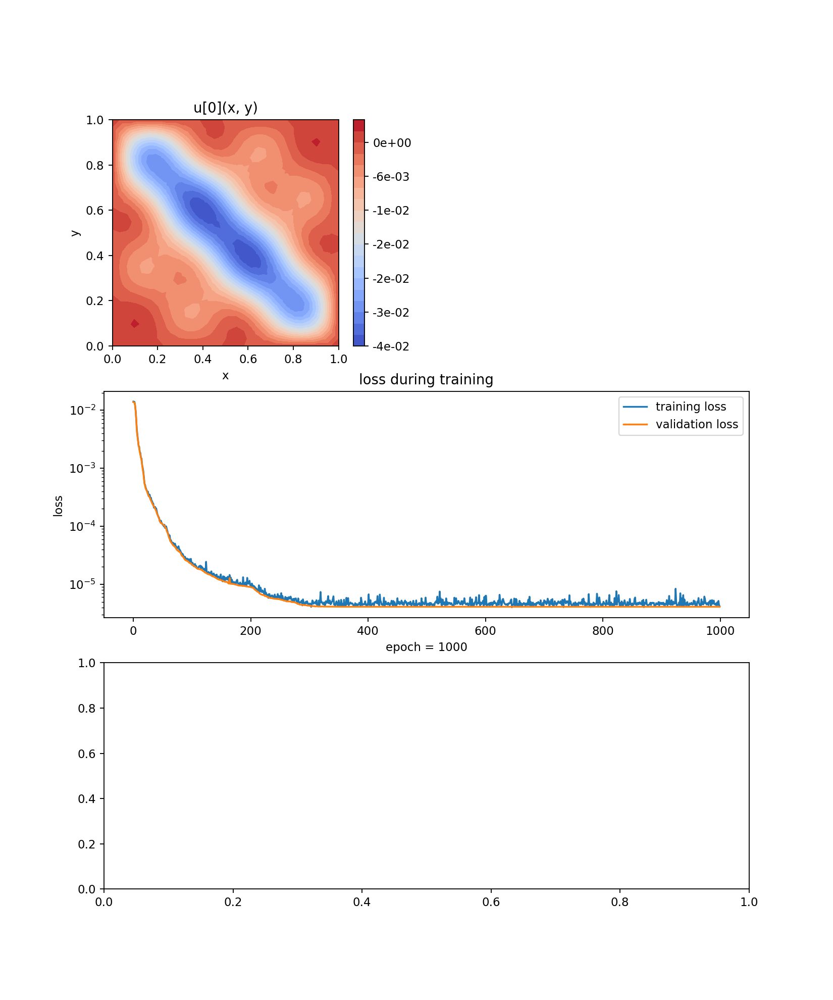

In [16]:
solver_lbgfs1 = Solver2D(
    pde_system=poisson2,
    conditions=conditions,
    xy_min=(0, 0),  
    xy_max=(1, 1),  
    nets=nets_lr1,
    train_generator=train_gen,
    valid_generator=valid_gen,
    optimizer=LBFGS(chain.from_iterable(n.parameters() for n in nets_lr1), lr=0.1),
)

solver_lbgfs1.fit(max_epochs=1000, callbacks=[Monitor2D(check_every=100, xy_min=(0, 0), xy_max=(1, 1)).to_callback()])

solution_poisson_lbgfs1 = solver_lbgfs1.get_solution()

<IPython.core.display.Javascript object>


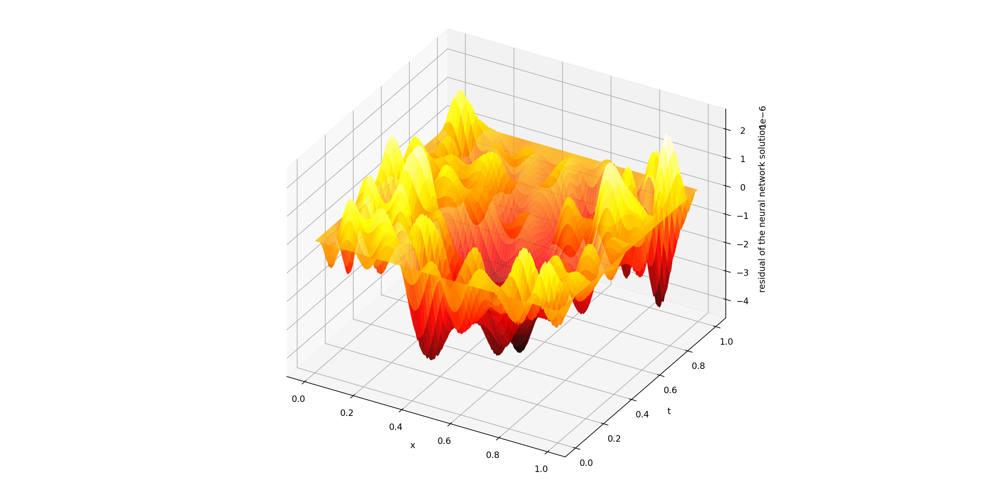

In [34]:
solution_analytical = lambda x, t: -np.sin(np.pi*x)*np.sin(np.pi*t)/(4*np.pi**2)+np.sin(2*np.pi*x)*np.sin(2*np.pi*t)/(8*np.pi**2)-np.sin(3*np.pi*x)*np.sin(3*np.pi*t)/(12*np.pi**2)+np.sin(4*np.pi*x)*np.sin(4*np.pi*t)/(16*np.pi**2)
sol_ana = solution_analytical(xx, tt)
sol_net = solution_poisson_lbgfs1(xx, tt, to_numpy=True)
plt_surf(xx, tt, sol_net-sol_ana, y_label='t', z_label='residual of the neural network solution')

## Observational Results

Judging from the error distribution graph, collocation points near boundaries will have less accurate approximations. We can conduct enhancement training to these small grids, reaching an overall better numerical trial solution.